https://seekingalpha.com/earnings/earnings-call-transcripts?sector=technology

https://finnhub.io/docs/api#stock-candles

https://github.com/Finnhub-Stock-API/finnhub-python

## Functions

In [1]:
def prepared_remarks(row):
    try:
        tagset = (row[0])
        premarks = tagset.find_all("h2")[1]
        output = ""
        for num, tag in enumerate(premarks.next_siblings):
            if tag.name == "p":
                if tag.text.endswith((".", "!", "?")):
                    text = tag.text + "\n "
                    output += text
                else:
                    pass
            else:
                if tag.name == "h2":
                    break
        return output
    except Exception as e:
        return None
    
    
def QA(row):
    try:
        tagset = (row[0])
        premarks = tagset.find_all("h2")[2]
        output = ""
        for num, tag in enumerate(premarks.next_siblings):
            if tag.name == "p":
                if tag.text.endswith((".", "?", "!")):
                    output += tag.text
                else:
                    pass
            else:
                if tag.name == "h2":
                    break
        return output
    except Exception as e:
        return None
    
def name(row):
    try:
        tagset = (row[0])
        ticker_span = tagset.find("span", {"class":"ticker"})
        ticker_p = ticker_span.find_parent("p")
        ticker_p.find("strong").get_text()
        ticker_span.get_text()
        output = ticker_p.find("strong").get_text()
        return output
    except Exception as e:
        return None
    
def find_ticker(row):
    try:
        tagset = (row[0])
        ticker_span = tagset.find("span", {"class":"ticker"})
        ticker_p = ticker_span.find_parent("p")
        ticker_p.find("strong").get_text()
        ticker_span.get_text()
        output = ticker_span.get_text()
        return output
    except Exception as e:
        return None
def date(row):
    try:
        tagset = (row[0])
        date = tagset.find("span", {"id":"date"})
        output = date.get_text()
        return output
    except Exception as e:
        return None

def time_of(row):
    try:
        tagset = (row[0])
        time = tagset.find("em", {"id":"time"})
        output = time.get_text()
        return output
    except Exception as e:
        return None
    
def hour(time):
    try:
        hour = re.search("[0-9]{0,2}", time)
        return int(hour.group())
    except Exception as e:
        return None

def date_transform(date):
    try:
        t = datetime.strptime(date, '%b %d, %Y')
        return (t)
    except Exception as e:
        return None

def adjusted_date(date, ampm):
    HOLIDAYS_US = holidays.US()
    next_day = date + timedelta(days=1)
    while next_day.weekday() in holidays.WEEKEND or next_day in HOLIDAYS_US:
        next_day += timedelta(days=1)
    if ampm == 'pm':
        date = next_day
    return date

def next_date(date):
    HOLIDAYS_US = holidays.US()
    next_day = date + timedelta(days=1)
    while next_day.weekday() in holidays.WEEKEND or next_day in HOLIDAYS_US:
        next_day += timedelta(days=1)
    date = next_day
    return date

def prev_date(date):
    HOLIDAYS_US = holidays.US()
    prev_day = date - timedelta(days=1)
    while prev_day.weekday() in holidays.WEEKEND or prev_day in HOLIDAYS_US:
        prev_day -= timedelta(days=1)
    date = prev_day
    return date

def ticker_and_exchange(row,split,character):
    try:
        return row.split(":")[split].replace(character,"")
    except Exception as e:
        return None
    
def earnings_for_date(row):
    try:
        e_date = row.split("ending")[1]
        return datetime.strptime(e_date, ' %B %d, %Y.')

    except Exception as e:
        return None

def candle(ticker,f,t):
    try:
        f1 = f.strftime('%Y-%m-%d')
        f2 = t.strftime('%Y-%m-%d')
        u1 = int(time.mktime(datetime.strptime(f1, "%Y-%m-%d").timetuple()))
        u2 = int(time.mktime(datetime.strptime(f2, "%Y-%m-%d").timetuple()))
        res = finnhub_client.stock_candles(ticker, 'D', u1, u2)
        return res
    except Exception as e:
        return None
    
def eps_surprise(ticker):
    try:
        # Earnings surprises
        es = finnhub_client.company_earnings(ticker, limit=4)
        return es
    except Exception as e:
        return None
    
def finnhubIndustry(ticker):
    try:
        # finnhubIndustry
        ind = finnhub_client.company_profile2(symbol=ticker)
        return ind['finnhubIndustry']
    except Exception as e:
        return None
    
def stacked_bar_width_plot(df, value_cols, width_col, colors=None, **subplot):
    """A stacked column plot with variable bar width.
       :param df
       :param list value_cols: columns of `df`, already normalized (sum=1 for every line).
       :param str width_col: column of `df`, unbounded, used (i) as label (ii) to compute width.
       :param dict subplot: optional figure/row/col
    """
    categories = df.index.to_list()
    width = df[width_col]
    htmpl = width_col + ': %{customdata}, %{y}'
    x = np.cumsum([0] + list(width[:-1]))
    colors = colors or [None, ] * len(value_cols)

    figure = subplot.pop('figure', go.Figure())
    for colname, color in zip(value_cols, colors):
        figure.add_trace(go.Bar(name=colname, x=x, y=df[colname], width=width, hovertemplate=htmpl, customdata=width, offset=0, marker_color=color), **subplot)
    return figure.update_xaxes(
        tickvals=x + np.array(width) / 2,
        ticktext=categories,
        range=[0, np.sum(width)], **subplot
    ) \
        .update_yaxes(tickformat=',.0%', range=[0, 1], row=subplot.get('row'), col=subplot.get('col')) \
        .update_layout(barmode='stack', bargap=0)


def mekko_plot(df, unit_name=None, colors=None, **subplot):
    """A mekko plot is a normalized stacked column plot with variable bar width.

       :param DataFrame df: already indexed by category, with only numeric columns:
                   there will be one stacked-bar per line (X), labeled after the index, with one bar per column.
       :param str unit_name: used to populate hover.
       :param list colors: color of each column. None for default palette (blue, red, ...).
       The rest (title..) is easily added afterwards.
    """
    # Normalize then defer to stacked_bar_width_plot plot.
    value_cols = df.columns
    w = pd.DataFrame({unit_name: df.sum(axis='columns')})
    w[value_cols] = df.div(w[unit_name], axis='index')

    return stacked_bar_width_plot(w, value_cols, width_col=unit_name, colors=colors, **subplot)

In [2]:
from bs4 import BeautifulSoup
from selenium import webdriver
from pyvirtualdisplay import Display
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.common.exceptions import TimeoutException
from selenium.webdriver.chrome.options import Options
import pandas as pd
from pandas import Series
from nltk.tokenize import sent_tokenize
import re
import calendar
from datetime import datetime, timedelta
import holidays
import time
import finnhub
import numpy as np
# Using graph_objects
import plotly.graph_objects as go
import plotly.express as px
from tqdm import tqdm
import matplotlib.pyplot as plt
import scipy.stats as stats
import researchpy as rp
import seaborn as sns
from pandas_profiling import ProfileReport

## Data collection

1. retrieve urls to scrape
2. Save body and header of each url
3. Parse through body

In [3]:
links = []
earnings = 'https://www.fool.com/earnings-call-transcripts/?page='
for num in tqdm(range(200,400)):
    try:
        n = str(num)
        options = Options()
        options.headless = True
        driver = webdriver.Chrome("/Users/thomascho/Downloads/chromedriver", options=options)
        driver.get(f'{earnings}{n}')
        html = driver.page_source
        soup = BeautifulSoup(html)
        h = soup.findAll("div",class_='list-content')
        for x in h:
            g =x.findAll('a', href=True)
            for y in g:
                links.append(y['href'])
        driver.quit()
    except Exception as e:
        print (e)

100%|██████████| 200/200 [10:20<00:00,  3.10s/it]


In [4]:
all_links = links
section_list = []
section_dict = {}
for link in tqdm(all_links, total=len(all_links)):
    try:
        options = Options()
        options.headless = True
        driver = webdriver.Chrome("/Users/thomascho/Downloads/chromedriver", options=options)
        t = f'https://www.fool.com{link}'
        driver.implicitly_wait(15)
        driver.get(t)
        html = driver.page_source
        soup = BeautifulSoup(html)
        section = soup.findAll('section', class_="article-body")
        header = soup.findAll('section', class_="article-header")
        earnings_for = header[0].find("h2").get_text()
        section_dict[link] = [section, earnings_for]
        driver.quit()
    except Exception as e:
        print (e)

 99%|█████████▉| 3972/4000 [5:20:25<03:24,  7.31s/it]  

Message: disconnected: Unable to receive message from renderer
  (Session info: headless chrome=86.0.4240.183)



100%|██████████| 4000/4000 [5:24:20<00:00,  4.87s/it]


In [5]:
df = pd.DataFrame(section_dict.items(), columns=['link', 'transcript'])
df['article'] = df['transcript'].apply(lambda x: x[0])
df['header'] = df['transcript'].apply(lambda x: x[1])
df['prepared_remarks'] = df['article'].apply(lambda x: prepared_remarks(x))
df['name'] = df['article'].apply(lambda x: name(x))
df['ticker_and_exchange'] = df['article'].apply(lambda x: find_ticker(x))
df['date'] = df['article'].apply(lambda x: date(x))
df['time'] = df['article'].apply(lambda x: time_of(x))
df['hour'] = df['time'].apply(hour)
df['ampm'] = df['time'].apply(lambda x: "pm" if 'p.m.' in x else "am")
df['day'] = df['date'].apply(date_transform)
df['adjusted_date'] = df.apply(lambda x: adjusted_date(x['day'], x['ampm']),axis=1)
df['prev_date'] = df.apply(lambda x: prev_date(x['adjusted_date']),axis=1)
df['next_date'] = df['adjusted_date'].apply(lambda x: next_date(x))
df['stock_exchange'] = df['ticker_and_exchange'].apply(lambda x:ticker_and_exchange(x,0,"("))
df['ticker'] = df['ticker_and_exchange'].apply(lambda x:ticker_and_exchange(x,1,")"))
df['remarks_tokenized'] = df['prepared_remarks'].apply(sent_tokenize)
df = df.explode('remarks_tokenized').reset_index(drop=True)

I ran a separate process to categorize the text. I downloaded the pandas dataframe, and then I ran `python predict.py --text_path test.txt --output_dir output/ --model_path models/classifier_model/finbert-sentiment`.

In [6]:
output = pd.read_csv("/Users/thomascho/Downloads/finbert_output.csv")
output.head()

,sentence,logit,prediction,sentiment_score
0,"""Greetings.",[0.05167038 0.05390081 0.8944288 ],neutral,-0.002230
1,Welcome to the At Home Second Quarter Fiscal Y...,[0.3214488 0.03500122 0.64355 ],neutral,0.286448
2,"At this time, all participants are in a listen...",[0.02097232 0.01900151 0.9600262 ],neutral,0.001971
3,A question-and-answer session will follow the ...,[0.02062134 0.01141967 0.96795905],neutral,0.009202
4,"[Operator Instructions] Please note, this conf...",[0.01981606 0.01429274 0.96589124],neutral,0.005523


In [7]:
df = df.merge(output, left_on='remarks_tokenized', right_on='sentence', how='inner', indicator=False)

Sign up for a finnhub api key. I use this key to make api requests to retrieve:
1. daily candle

In [8]:
# Setup client
finnhub_client = finnhub.Client(api_key="btgld8v48v6thhaqg5qg")
g = df.groupby(["ticker","prev_date","adjusted_date","next_date"]).count().reset_index()
t1 = g['ticker']
s1 = g['prev_date']
s2 = g['next_date']
candles = {}
for a, b, c in tqdm(zip(t1,s1,s2), total=(len(t1))):
    try:
        res = candle(a,b,c)
        o1 = res['o'][0]
        c1 = res['c'][0]
        o2 = res['o'][1]
        c2 = res['c'][1]
        ind = finnhubIndustry(a)
        candles[a + str(b) + str(c)] = [a, b, c, o1, c1, o2, c2, ind]
        time.sleep(2)
    except Exception as e:
        continue

100%|██████████| 3926/3926 [3:31:53<00:00,  3.24s/it]  


api call to get earnings per share actual vs estimate

In [9]:
t1 = g['ticker']
eps = []
print (len(t1))
for index,ticker in tqdm(enumerate(t1), total=len(t1)):
    earnings = eps_surprise(ticker)
    eps.append(earnings)
    time.sleep(1)

  0%|          | 0/3926 [00:00<?, ?it/s]

3926


100%|██████████| 3926/3926 [1:10:40<00:00,  1.08s/it]


flatten the list

In [10]:
eps_wo_none = list(filter((None).__ne__, eps))
flat_list = [item for sublist in eps_wo_none for item in sublist]
eps_df = pd.DataFrame(flat_list)

In [11]:
candles_df = pd.DataFrame.from_dict(candles, orient='index', columns=["ticker", "prev_date", "next_date", "o1", "c1", "o2", "c2", "industry"])

In [12]:
df2 = df.merge(candles_df, left_on=['ticker','prev_date'], right_on=['ticker','prev_date'], how='inner', indicator=False)
df2.dropna(inplace=True)
df2['earnings_for_date']= df2['header'].apply(lambda x: earnings_for_date(x))
df2['earnings_for_string'] = pd.to_datetime(df2['earnings_for_date'], errors='coerce').dt.strftime('%Y-%m-%d')

In [14]:
df3 = df2.merge(eps_df, left_on=["ticker","earnings_for_string"], right_on=["symbol","period"])
df3['eps_diff'] = df3['actual'] - df3['estimate']
df3['beat_or_miss'] = df3.apply(lambda x: 'beat' if x['eps_diff'] > 0 else 'miss', axis=1)
df3['price_diff'] = df3['c2'] - df3['o1']
df3['price_diff_c'] = df3['price_diff'].apply(lambda x:'increase' if x>0 else 'decrease')
df3['still_up'] = df3.apply(lambda x:1 if ((x['eps_diff']<0) & (x['price_diff']>0)) else 0, axis=1)
df3 = df3.loc[df3['prediction'].isin(['positive','negative'])]

In [15]:
agg_sentiment = df3.groupby(['ticker','day'])['prediction'].apply(lambda x: x.value_counts().index[0])
agg_sentiment.rename('agg_sentiment',inplace=True)

ticker  day       
AA      2020-04-22    positive
        2020-07-15    positive
AAL     2020-04-30    positive
AAN     2020-05-07    positive
AAOI    2020-02-27    positive
                        ...   
ZLAB    2020-03-19    positive
ZTO     2020-03-17    positive
        2020-05-21    positive
ZTS     2020-05-06    positive
ZYXI    2020-04-28    positive
Name: agg_sentiment, Length: 2973, dtype: object

In [16]:
df4 = df3.merge(agg_sentiment, on="ticker")

In [17]:
group = df4.groupby("ticker")
standard = group.first()
standard.reset_index(level=0, inplace=True)
standard.dropna(inplace=True)

## EDA

1. Pandas profile
2. Violin plot of ticker price movement
3. Earnings per share time series
4. Mekko plot

In [18]:
profile = ProfileReport(standard, title="Pandas Profiling Report")
profile

In [19]:
fig = px.violin(standard, y="price_diff", box=True, # draw box plot inside the violin
                points=False, # can be 'outliers', or False
                title = 'Price Difference Violin Plot',
                labels={
                     "price_diff": "Price Difference ($)",
                },
               )
fig.show()

In [20]:
top_industry = standard.groupby("industry")['price_diff'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(10)
top_industry

,industry,count
40,Technology,198
36,Real Estate,195
20,Health Care,160
7,Biotechnology,146
5,Banking,141
17,Energy,131
18,Financial Services,131
29,Media,90
27,Machinery,72
23,Insurance,71


In [21]:
for industry in top_industry['industry']:
    ind = standard[standard['industry'] == industry]
    fig = px.violin(ind, y="price_diff", box=True, # draw box plot inside the violin
                    points=False, # can be 'outliers', or False
                    x = 'industry',
                    title = f'Price Difference Violin Plot in {industry}',
                    labels={
                        "price_diff": "Price Difference ($)",
                        "industry": "Industry",
                     },
                   )
    fig.show()

In [22]:
fig = px.violin(standard, y="price_diff", x="industry", box=True, points="all",
                title = f'Price Difference Violin Plot Breakdown',
                labels={
                    "price_diff": "Price Difference ($)",
                    "industry": "Industry",
                 },
               )
fig.show()

In [23]:
fig = go.Figure(data=go.Scatter(x=standard['day'], y=standard['eps_diff'], mode='markers'))
fig.update_layout(
    title="EPS Difference Time Series",
    xaxis_title="Date",
    yaxis_title="EPS Difference ($)",
)
fig.show()

In [24]:
fig = go.Figure(data=go.Scatter(x=standard['day'], y=standard['beat_or_miss'], mode='markers'))
fig.update_layout(
    title="Beat or Miss EPS Time Series",
    xaxis_title="Date",
    yaxis_title="Beat or Miss",
)
fig.show()

In [25]:
fig = go.Figure(data=go.Scatter(x=standard['day'], y=standard['price_diff'], mode='markers'))
fig.update_layout(
    title="Stock Price Difference Time Series",
    xaxis_title="Date",
    yaxis_title="Stock Price Difference ($)",
)
fig.show()

In [26]:
xtreme_10 = standard[(standard.price_diff > standard.price_diff.quantile(.95)) | (standard.price_diff < standard.price_diff.quantile(.05))]


colors = ['green' if x == 'positive' else 'red' for x in xtreme_10['agg_sentiment']]


fig = go.Figure(data=[go.Bar(
    x=xtreme_10['ticker'],
    y=xtreme_10['price_diff'],
    marker_color=colors # marker color can be a single color value or an iterable
)])
fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green"
)
fig.update_layout(
    title="""Price difference between closing date and opening date for earnings call for top 10%""",
    xaxis_title="Tickers",
    yaxis_title="Price Difference ($)",
    legend_title="Sentiment",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    )
)
fig.show()

colors = ['green' if x == 'beat' else 'red' for x in xtreme_10['beat_or_miss']]


fig = go.Figure(data=[go.Bar(
    x=xtreme_10['ticker'],
    y=xtreme_10['price_diff'],
    marker_color=colors # marker color can be a single color value or an iterable
)])

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green"
)
fig.update_layout(
    title="""Price difference between closing date and opening date for earnings call for top 10%""",
    xaxis_title="Tickers",
    yaxis_title="Price Difference ($)",
    legend_title="Beat or Miss EPS",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    )
)
fig.show()

In [27]:
mekko_df = standard[['beat_or_miss','agg_sentiment','industry','price_diff_c']].copy()
mekko_df = mekko_df.merge(top_industry, on="industry")
mekko_df['beat'] = mekko_df['beat_or_miss'].apply(lambda x: 1 if x =='beat' else 0)
mekko_df['miss'] = mekko_df['beat_or_miss'].apply(lambda x: 1 if x =='miss' else 0)
mekko1 = mekko_df.groupby("industry")[['beat','miss']].sum()
mekko_plot(mekko1, unit_name='# of tickers', colors=['green', 'red'])

In [28]:
mekko_df['positive_sent'] = mekko_df['agg_sentiment'].apply(lambda x: 1 if x =='positive' else 0).copy()
mekko_df['negative_sent'] = mekko_df['agg_sentiment'].apply(lambda x: 1 if x =='negative' else 0).copy()
mekko2 = mekko_df.groupby("industry")[['positive_sent','negative_sent']].sum()
mekko_plot(mekko2, unit_name='# of tickers', colors=['green', 'red'])

In [29]:
mekko_df['price_up'] = mekko_df['price_diff_c'].apply(lambda x: 1 if x =='increase' else 0).copy()
mekko_df['price_down'] = mekko_df['price_diff_c'].apply(lambda x: 1 if x =='decrease' else 0).copy()
mekko3 = mekko_df.groupby("industry")[['price_up','price_down']].sum()
mekko_plot(mekko3, unit_name='# of tickers', colors=['green', 'red'])

In [30]:
daily_ticker_count = standard.groupby("day")['ticker'].count().reset_index()
fig = go.Figure([go.Scatter(x=daily_ticker_count['day'], y=daily_ticker_count['ticker'])])
fig.update_layout(
    title={
        'text': "Daily count of tickers",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="Date",
    yaxis_title="Tickers",)
fig.show()

# Statistical Tests

### independent T-test on price
### mann-whitney u test on price
### Chi Square Test of Indepedence

## Indepedent T-Test

In [31]:
## Independent T-Test

summary, results = rp.ttest(group1= standard['price_diff'][standard['agg_sentiment'] == 'positive'], group1_name= "Positive",
         group2= standard['price_diff'][standard['agg_sentiment'] == 'positive'], group2_name= "Negative")

print (summary)

   Variable       N      Mean        SD        SE  95% Conf.  Interval
0  Positive  2063.0 -0.275775  5.789042  0.127455  -0.525729 -0.025821
1  Negative  2063.0 -0.275775  5.789042  0.127455  -0.525729 -0.025821
2  combined  4126.0 -0.275775  5.788341  0.090113  -0.452446 -0.099104


In [32]:
print (results)

                    Independent t-test  results
0  Difference (Positive - Negative) =       0.0
1                Degrees of freedom =    4124.0
2                                 t =       0.0
3             Two side test p value =       1.0
4            Difference < 0 p value =       0.5
5            Difference > 0 p value =       0.5
6                         Cohen's d =       0.0
7                         Hedge's g =       0.0
8                     Glass's delta =       0.0
9                                 r =       0.0


In [33]:
## Assumptions check

# HOMOGENEITY OF VARIANCE

stats.levene(standard['price_diff'][standard['agg_sentiment'] == 'positive'],
             standard['price_diff'][standard['agg_sentiment'] == 'negative'])


LeveneResult(statistic=0.9670148858514074, pvalue=0.3255297144245297)

/Users/thomascho/opt/anaconda3/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/thomascho/opt/anaconda3/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



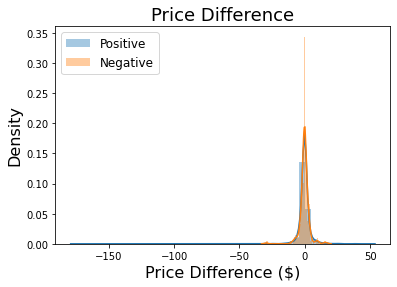

In [34]:
sns.distplot(standard['price_diff'][standard['agg_sentiment'] == 'positive'], label="Positive")
sns.distplot(standard['price_diff'][standard['agg_sentiment'] == 'negative'], label="Negative")
plt.title('Price Difference', fontsize=18)
plt.xlabel('Price Difference ($)', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.legend(prop={'size': 12})
plt.show()

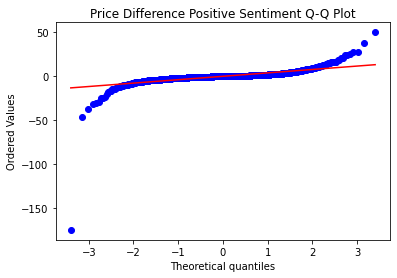

In [35]:
stats.probplot(standard['price_diff'][standard['agg_sentiment'] == 'positive'], dist="norm", plot= plt)
plt.title("Price Difference Positive Sentiment Q-Q Plot")
plt.show()

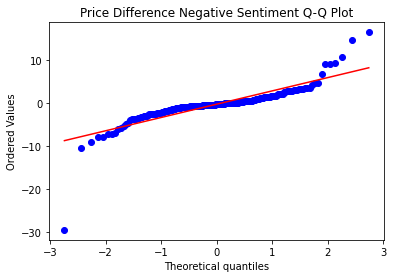

In [36]:
stats.probplot(standard['price_diff'][standard['agg_sentiment'] == 'negative'], dist="norm", plot= plt)
plt.title("Price Difference Negative Sentiment Q-Q Plot")
plt.show()

In [37]:
stats.shapiro(standard['price_diff'][standard['agg_sentiment'] == 'positive'])

(0.4545711874961853, 0.0)

In [38]:
stats.shapiro(standard['price_diff'][standard['agg_sentiment'] == 'negative'])

(0.7418502569198608, 1.3812682696547092e-18)

In [39]:
# mannwhitneyu

## Use only when the number of observation in each sample is > 20 and you have 2 independent samples of ranks. Mann-Whitney U is significant if the u-obtained is LESS THAN or equal to the critical value of U.

In [40]:
stats.mannwhitneyu(standard['price_diff'][standard['agg_sentiment'] == 'positive'], standard['price_diff'][standard['agg_sentiment'] == 'negative'],alternative='two-sided')

MannwhitneyuResult(statistic=234023.5, pvalue=0.9027620808303042)

## Chi Square Test of Indepedence

In [41]:
##CHI SQUARE

crosstab = pd.crosstab(standard["beat_or_miss"], standard["agg_sentiment"])

crosstab

chi1 = stats.chi2_contingency(crosstab)
if chi1[1]<.05:
    print ("beat_or_miss is statistically different from aggregate sentiment")
else:
    print ("beat_or_miss IS NOT statistically different from aggregate sentiment")


crosstab = pd.crosstab(standard["beat_or_miss"], standard["price_diff_c"])

crosstab

chi2 = stats.chi2_contingency(crosstab)
if chi2[1]<.05:
    print ("beat_or_miss is statistically different from price difference")
else:
    print ("beat_or_miss IS NOT statistically different from price difference")

crosstab = pd.crosstab(standard["agg_sentiment"], standard["price_diff_c"])

crosstab

chi3 = stats.chi2_contingency(crosstab)
if chi3[1]<.05:
    print ("aggregate sentiment is statistically different from price difference")
else:
    print ("aggregate sentiment IS NOT statistically different from price difference")

beat_or_miss is statistically different from aggregate sentiment
beat_or_miss IS NOT statistically different from price difference
aggregate sentiment IS NOT statistically different from price difference


In [42]:
print (chi1)

(5.424309463630804, 0.019858287069190416, 1, array([[ 126.09166303, 1140.90833697],
       [ 101.90833697,  922.09166303]]))
